In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import sys
from scipy.ndimage import generic_filter


    

In [2]:
sample = 'dataset/samples/T30TXP/T30TXP_1.npz' 
file = np.load(sample)
print("Keys:", list(file.keys()))
print("Shapes of all variables:")
for key in file.keys():
    print("Shape of", key,":", file[key].shape)
    
print()
count = np.count_nonzero(file['gedi'][:,:, :, :], axis=(1,2,3))
for i in range(file['gedi'].shape[0]):
    print("GEDI points in year", i+2018, ":", count[i])

    

Keys: ['sentinel2', 'sentinel1', 'gedi', 'gedi_supplemental', 'tandemx_fnf', 'tandemx_dem', 'alos']
Shapes of all variables:
Shape of sentinel2 : (7, 12, 12, 128, 128)
Shape of sentinel1 : (7, 4, 2, 128, 128)
Shape of gedi : (7, 6, 128, 128)
Shape of gedi_supplemental : (5, 7, 6, 128, 128)
Shape of tandemx_fnf : (128, 128)
Shape of tandemx_dem : (128, 128)
Shape of alos : (7, 3, 128, 128)

GEDI points in year 2018 : 0
GEDI points in year 2019 : 36
GEDI points in year 2020 : 0
GEDI points in year 2021 : 0
GEDI points in year 2022 : 6
GEDI points in year 2023 : 0
GEDI points in year 2024 : 42


## Sentinel-2

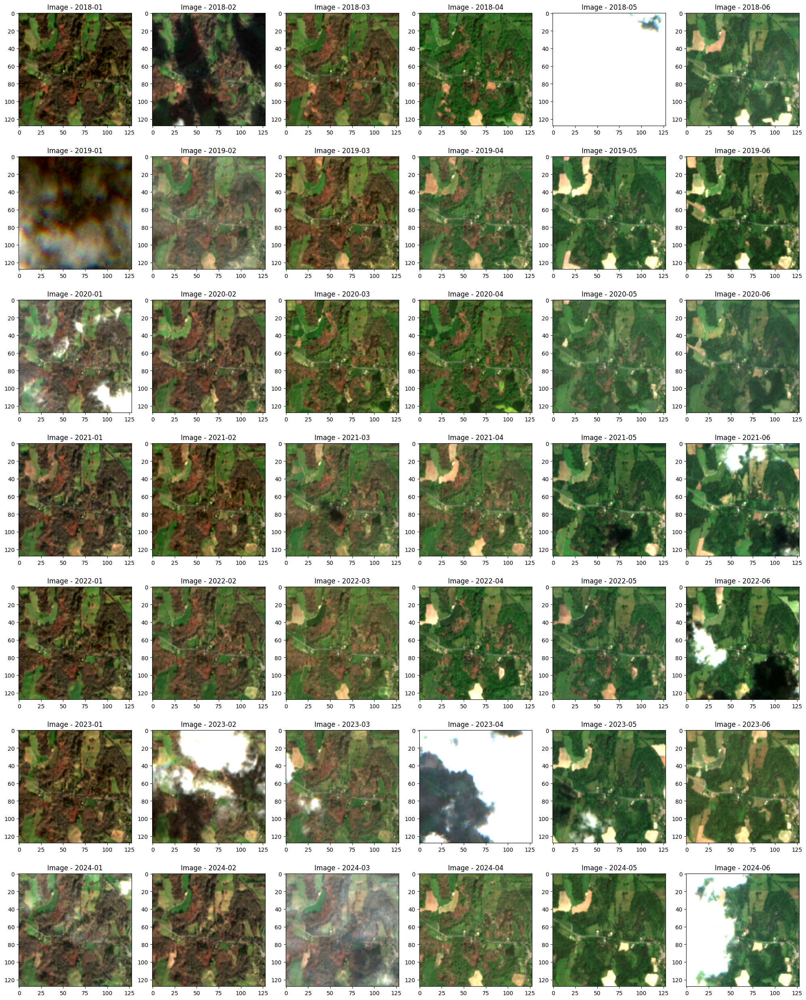

In [3]:
fig, axes = plt.subplots(7, 6, figsize=(20,25))

sentinel2 = np.roll(file['sentinel2'], 1, axis=0)

year = 0

for i in range(7):
    for j in range(6):
        idx = j
        if idx >= sentinel2.shape[1]:
            break
        data = np.clip(sentinel2[i,idx, [3,2,1]], 0, 1500)
        year_string = 2018 + i
        month = idx % 12 + 1
        axes[i, j].set_title(f"Image - {year_string}-{month:02d}")
        data = (data / 1500).transpose(1, 2, 0)
        axes[i, j].imshow(data)

plt.tight_layout()
plt.show()

## Slope

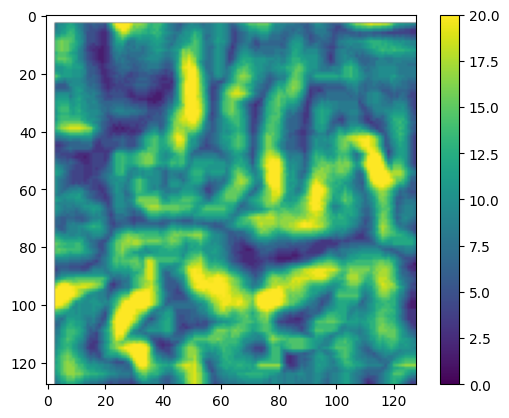

In [4]:
from scipy import ndimage
data = file['tandemx_dem']
valid_mask = data != -9999

elev_copy = data.astype(np.float32)
elev_copy[~valid_mask] = np.nan

pixel_window = 7

# Apply 3x3 minimum and maximum filters to get neighborhood min/max
min_elev = ndimage.minimum_filter(elev_copy, size=pixel_window, mode='constant', cval=np.nan)
max_elev = ndimage.maximum_filter(elev_copy, size=pixel_window, mode='constant', cval=np.nan)

# Calculate elevation difference
elev_diff = max_elev - min_elev

# Calculate slope assuming min and max are 3 pixels apart
# Distance = 3 pixels = 30m
distance = pixel_window * 10
slope_radians = np.arctan(elev_diff / distance)
slope_degrees = np.degrees(slope_radians)

plt.imshow(slope_degrees,vmin=0,vmax=20)
plt.colorbar()

## Sentinel-1

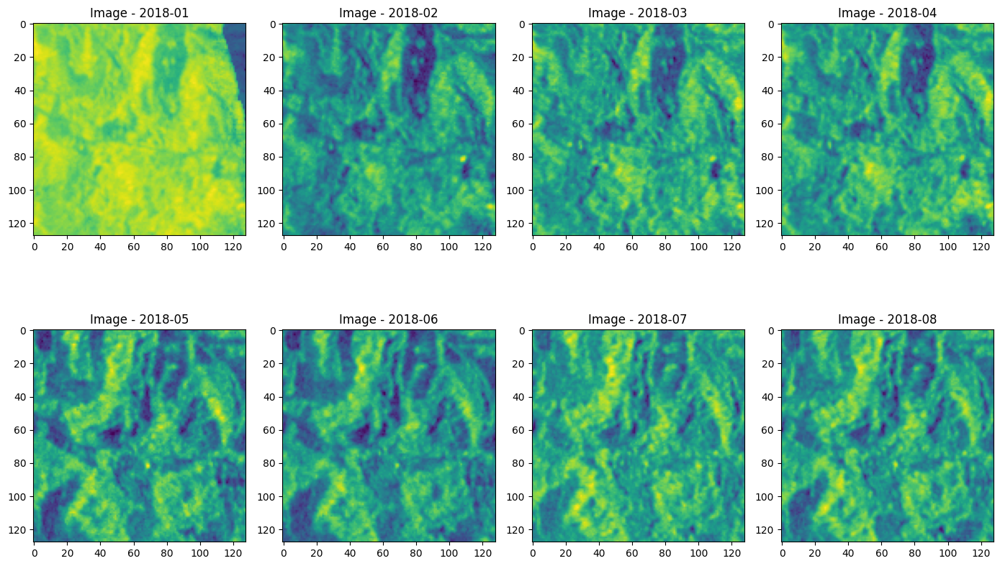

In [5]:
fig, axes = plt.subplots(2, 4, figsize=(14,9))
sentinel1 = file['sentinel1']

year = 0

for i in range(2):
    for j in range(4):
        idx = i * 4 + j
        data = sentinel1[year,j, i, :, :]
        year_string = 2018 + year
        month = idx % 12 + 1
        axes[i, j].set_title(f"Image - {year_string}-{month:02d}")
        data = data
        axes[i, j].imshow(data)

plt.tight_layout()
plt.show()

## GEDI

In [6]:
file["gedi"].shape
count = np.count_nonzero(file['gedi'][:,:, :, :], axis=(1,2,3))
for i in range(file['gedi'].shape[0]):
    print("GEDI points in year", i+2018, ":", count[i])

    

GEDI points in year 2018 : 0
GEDI points in year 2019 : 36
GEDI points in year 2020 : 0
GEDI points in year 2021 : 0
GEDI points in year 2022 : 6
GEDI points in year 2023 : 0
GEDI points in year 2024 : 42


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..2.054].


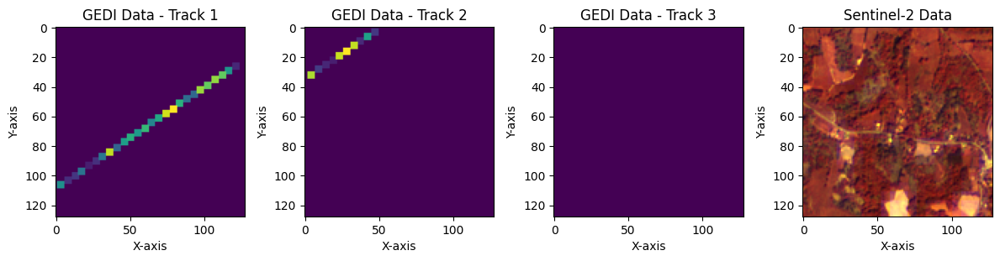

In [7]:
fig, ax = plt.subplots(1, 4, figsize=(12, 3))

# Plotting the GEDI data
year = 1  # Set the year index


data = file['gedi'][year,0, :, :]
data = generic_filter(data, lambda x: np.max(x), size=5)
ax[0].imshow(data, vmin=0, vmax=30)
ax[0].set_title(f'GEDI Data - Track 1')
ax[0].set_xlabel('X-axis')
ax[0].set_ylabel('Y-axis')

data = file['gedi'][year,1, :, :]
data = generic_filter(data, lambda x: np.max(x), size=5)
ax[1].imshow(data, vmin=0, vmax=30)
ax[1].set_title(f'GEDI Data - Track 2')
ax[1].set_xlabel('X-axis')
ax[1].set_ylabel('Y-axis')

data = file['gedi'][year,2, :, :]
data = generic_filter(data, lambda x: np.max(x), size=5)
ax[2].imshow(data, vmin=0, vmax=30)
ax[2].set_title(f'GEDI Data - Track 3')
ax[2].set_xlabel('X-axis')
ax[2].set_ylabel('Y-axis')




# Plotting the Sentinel-2 data
sentinel2_data = sentinel2[0,3, [2,1,0], :, :].transpose(1, 2, 0) / 1000
ax[3].imshow(sentinel2_data)
ax[3].set_title('Sentinel-2 Data')
ax[3].set_xlabel('X-axis')
ax[3].set_ylabel('Y-axis')

plt.tight_layout()
plt.show()


## TandemX Forest/Non-Forest

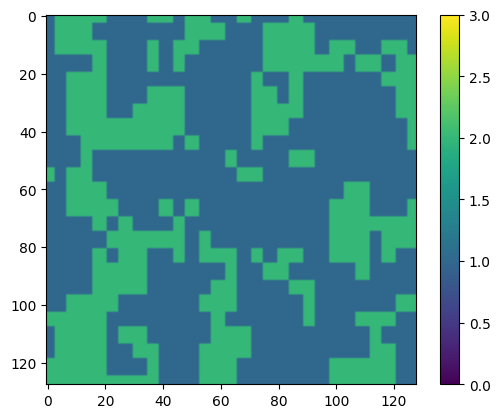

In [8]:
tandemx_fnf = file['tandemx_fnf']

plt.imshow(tandemx_fnf, vmin=0, vmax=3)
plt.colorbar()

## TandemX DEM

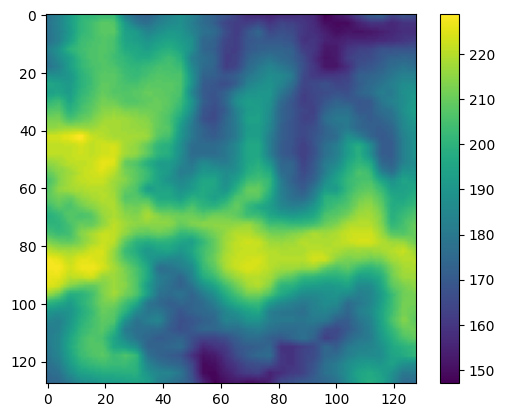

In [9]:
tandemx_dem = file['tandemx_dem']

plt.imshow(tandemx_dem)
plt.colorbar()

## ALOS 2

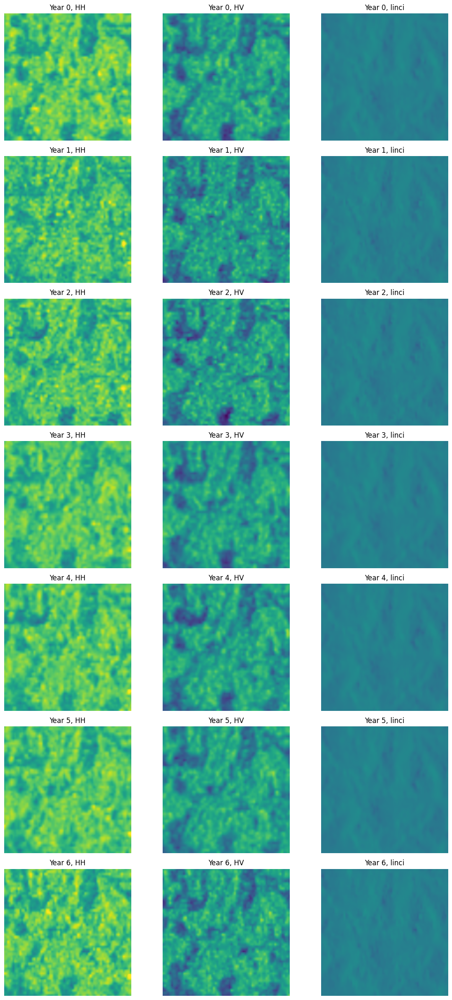

In [10]:
alos_data = file["alos"]
alos_data = (10 * np.log10(alos_data**2)) - 83

# Create a 6x3 grid plot for ALOS data
fig, axes = plt.subplots(7, 3, figsize=(12, 24))

for year in range(7):
    for band in range(3):
        if band == 2:
            axes[year, band].imshow(alos_data[year, band],vmin=-90,vmax=0)
        else:
            axes[year, band].imshow(alos_data[year, band],vmin=-30,vmax=1)
        axes[year, band].set_title(f'Year {year}, {["HH","HV","linci"][band]}')
        axes[year, band].axis('off')

plt.tight_layout()
plt.show()

## GEDI Supplemental Data

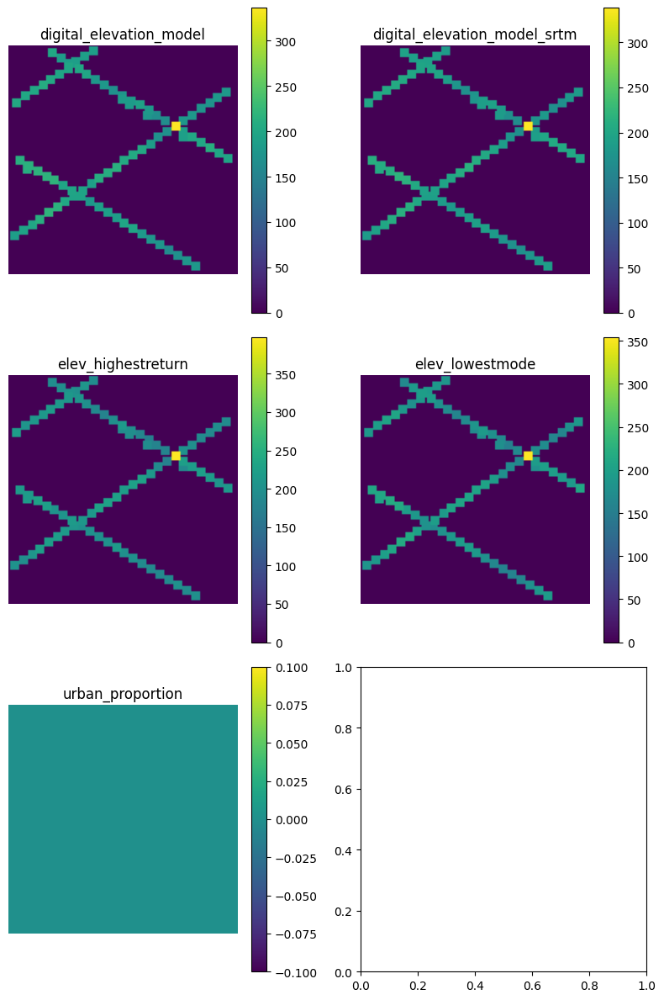

In [11]:

def nan_if(arr, value):
    return np.where(arr == value, np.nan, arr)

data = nan_if(file['gedi_supplemental'], -9999)
data = np.nansum(data, axis=(1,2))


# Create a 5x2 grid plot for GEDI supplemental data
fig, axes = plt.subplots(3, 2, figsize=(8, 12))
columns = [
        "digital_elevation_model",
        "digital_elevation_model_srtm", 
        "elev_highestreturn",
        "elev_lowestmode",
        "urban_proportion"
    ]
for i in range(5):
    row = i // 2
    col = i % 2
    im = axes[row, col].imshow(generic_filter(data[i], lambda x: np.max(x), size=5))
    plt.colorbar(im, ax=axes[row, col])
    axes[row, col].set_title(f'{columns[i]}')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()
